# Анализ оттока клиентов банка

## Содержание проекта <a id="Project_content"></a> 

- **Введение**
    1. [Описание проекта](#Project_description)
    2. [Цель проекта](#Project_objective)
    3. [Описание данных](#Data_description)
    4. [План работа](#Work_plan)
    
   
- **Анализ данных**
    1. [Загрузка и ознакомление с данными](#Reading_data)
        - [Промежуточный вывод](#Intermediate_output)
    2. [Предобработка данных](#Data_Preprocessing)
        - [Обработка пропущенных значений](#Data_Preprocessing_1)
        - [Обработка выбросов](#Data_Preprocessing_2)
        - [Обработка дубликатов](#Data_Preprocessing_3)
        - [Промежуточный вывод](#Intermediate_output_2)
    3. [Исследовательский анализ данных](#Data_analysis)
        - [Исследование распределения значений в графиках](#Data_analysis_1)
        - [Категоризация данных](#Data_analysis_2)
        - [Исследование распределения значений в таблицах](#Data_analysis_3)
        - [Кореляция](#Data_analysis_4)
        - [Промежуточный вывод](#Intermediate_output_3)
        - [Предварительный вывод](#Intermediate_output_3_1)
    4. [Проверка гипотез](#Hypothesis_test)
        - [Промежуточный вывод](#Intermediate_output_4)
    5. [Сегментации клиентов и их анализ](#Customer_segment)
        - [Создание высокоточных групп пользователей из 5 параметров](#Customer_segment_1)
    6. [Выводы](#Conclusion)
    7. [Рекомендации](#Recomendation)
    8. [Презентация](#Presentation) 

## Описание проекта <a id="Project_description"></a> 
В последнее время в банке наблюдается драматический рост оттока клиентов, что начинает вызывать беспокойство и угрожать существованию банка. Необходимо выделить определенные сегменты клиентов, которые являются наиболее подверженными оттоку, чтобы маркетинговый отдел мог в дальнейшем воздействовать на эти сегменты и снизить отток. 

## Цель проекта <a id="Project_objective"></a> 
- Сделать выводы о том, какие признаки стратегическим образом влияют на отток и какие значения или интервалы этих признаков связаны с оттоком
- Выделить компактные высокоотточные сегменты, приоритизировать их
- Дать конкретные рекомендации по приоритетным сегментам
- Подготовить презентацию со всеми ключевыми моментами

## Описание данных <a id="Data_description"></a> 

Датасет [bank_scrooge.csv](https://code.s3.yandex.net/datasets/bank_scrooge.csv) содержит данные о клиентах банка «Метанпром». Банк располагается в Ярославле и областных городах: Ростов Великий и Рыбинск.

Описание столбцов:
- user_id — идентификатор пользователя,
- score — баллы кредитного скоринга, 
- city — город,
- gender — пол,
- age — возраст,
- equity — приблизительная оценка количества баллов собственности
- balance— баланс на счёте,
- products - количество продуктов, которыми пользуется клиент,
- credit_card — есть ли кредитная карта, 
- last_activity — активный клиент, 
- salary — оценочный доход клиента, 
- сhurn — признак оттока.

## План работ <a id="Work_plan"></a> 
1. Загрузка и первичное ознакомление с данными
    - загрузка данных
    - ознакомление с данными
    - обработка названий и типов данных в столбцах
    - промежуточный вывод
2. Предобработка данных
    - обработка пропущенных значений
    - обработка дубликатов
    - обработка выбросов
    - промежуточный вывод
3. Исследовательский анализ данных
    - исследование распределение клиентов по признакам
    - исследование коррелиции 
    - промежуточный вывод
4. Проверка гипотез
    - Проверка гипотез
    - промежуточный вывод
5. Сегментации клиентов и их анализ.
    - создание дополнительных столбцов с категоризированными данными
    - сегментация клиентов по признакам
    - сравнение групп клиентов и их приотиризация
6. Вывод и рекомедации
7. Презентация

## Загрузка и ознакомление с данными <a id="Reading_data"></a> 

### Загрузка данных

In [1]:
# Импорт необходимых библиотек
import pandas as pd
import numpy as np
import phik
import itertools
import scipy.stats as st
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots


In [2]:
#Чтение датасета
try:
    data = pd.read_csv('datasets/bak_scrooge.csv')
except:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/bank_scrooge.csv')

data.head()

,USERID,score,city,gender,age,equity,balance,products,credit_card,last_activity,EST_SALARY,churn
0,183012,850.0,Рыбинск,Ж,25.0,1,59214.82,2,0,1,75719.14,1
1,146556,861.0,Рыбинск,Ж,37.0,5,850594.33,3,1,0,86621.77,0
2,120722,892.0,Рыбинск,Ж,30.0,0,NaN,1,1,1,107683.34,0
3,225363,866.0,Ярославль,Ж,51.0,5,1524746.26,2,0,1,174423.53,1
4,157978,730.0,Ярославль,М,34.0,5,174.00,1,1,0,67353.16,1


In [3]:
# Создадим функцию, чтобы отслеживать кол-во удлаенных строк и изменение процента уходящих людей

org_rows = data.shape[0] 
org_churn = round(data[data.churn==1].shape[0]/org_rows*100, 2)

def check_rows():
    now_rows = data.shape[0]
    now_churn = round(data[data.churn==1].shape[0]/now_rows*100, 2)
    print(f'Всего строк {now_rows}.')
    print(f'Было удаленно {org_rows-now_rows} строк, \
или {round(100-now_rows/org_rows*100, 2)}% от первоначального кол-ва строк.')
    print(f'Процент уходящих клиентов первоначально {org_churn}%, сейчас {now_churn}%')

# Выведим данные функции и информацию о данных
check_rows()
print('-'*80)
data.info()

Всего строк 10000.
Было удаленно 0 строк, или 0.0% от первоначального кол-ва строк.
Процент уходящих клиентов первоначально 18.2%, сейчас 18.2%
--------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   USERID         10000 non-null  int64  
 1   score          10000 non-null  float64
 2   city           10000 non-null  object 
 3   gender         10000 non-null  object 
 4   age            9974 non-null   float64
 5   equity         10000 non-null  int64  
 6   balance        7705 non-null   float64
 7   products       10000 non-null  int64  
 8   credit_card    10000 non-null  int64  
 9   last_activity  10000 non-null  int64  
 10  EST_SALARY     10000 non-null  float64
 11  churn          10000 non-null  int64  
dtypes: float64(4), int64(6), object(2)
memory usag

Видим, что присутвует немного пропусков age в столбце и много в столбце balance

In [4]:
# Переименуем столбцы
data = data.rename(columns={'USERID': 'user_id', 'EST_SALARY': 'salary'})

# Приведем столбцы в нужный формат
data[['score', 'salary']] = data[['score', 'salary']].astype('int64')

# Выведим описательную статистику для ознакомления с даннысм
data.describe().round(2)

,user_id,score,age,equity,balance,products,credit_card,last_activity,salary,churn
count,10000.00,10000.00,9974.00,10000.00,7.705000e+03,10000.00,10000.00,10000.00,10000.00,10000.00
mean,171814.71,848.70,42.73,2.63,8.277943e+05,1.87,0.68,0.52,147866.39,0.18
std,33708.24,65.45,12.18,1.98,1.980614e+06,0.79,0.47,0.50,139388.51,0.39
min,94561.00,642.00,18.00,0.00,0.000000e+00,0.00,0.00,0.00,2546.00,0.00
25%,142810.25,802.00,33.00,0.00,2.955542e+05,1.00,0.00,0.00,75251.75,0.00
50%,172728.00,853.00,40.00,3.00,5.242722e+05,2.00,1.00,1.00,119657.50,0.00
75%,201261.75,900.00,51.00,4.00,9.807058e+05,2.00,1.00,1.00,174499.75,0.00
max,229145.00,1000.00,86.00,9.00,1.191136e+08,5.00,1.00,1.00,1395064.00,1.00


### Промежуточный вывод <a id="Intermediate_output"></a>
1. В данных есть пропуски в столбцах age и balance, а также сильные выбросы в столбцах balance и salary.
2. В столбце products находятся клиенты, у которых ноль продуктов банка, но это невозможно.
3. В столбце salary есть клиенты с очень низкой зарплатой, намного ниже минимального размера оплаты труда (МРОТ). Стоит подробнее изучить эту ситуацию.
4. Всего в таблице 10 000 записей. Процент клиентов, которые уходят, составляет 18,2%. В дальнейшем мы будем ориентироваться на эту цифру.

- [Вернуться к содержанию проекта](#Project_content)

## Предобработка данных <a id="Data_Preprocessing"></a> 

### Обработка пропущенных значений <a id="Data_Preprocessing_1"></a> 

In [5]:
# Удалим строки с пропусками в столбце age, так как их немного
data = data.dropna(subset=['age']).reset_index(drop=True)

# Приведем в удобный формат для работы столбец
data.age = data.age.astype('int64')

# Проверим, сколько удалилось
check_rows()

Всего строк 9974.
Было удаленно 26 строк, или 0.26% от первоначального кол-ва строк.
Процент уходящих клиентов первоначально 18.2%, сейчас 18.24%


In [6]:
# Изучим пропуски в столбце баланса. 

print(data[data.balance.isna()].churn.value_counts())
round(data[data.balance.isna()].churn.value_counts() / data[data.balance.isna()].shape[0] * 100, 2)

0    2266
1      13
Name: churn, dtype: int64


0    99.43
1     0.57
Name: churn, dtype: float64

Мы видим большое кол-во пропусков, а также, что почти все пропуски у клиентов, которые остаются

In [7]:
# Проверим есть ли, клиенты с 0 балансом
display(data[data.balance == 0])

# Посмотрим распределение клиентов, у которых нет пропуска в балансе
print(data[data.balance.notna()].churn.value_counts())
round(data[data.balance.notna()].churn.value_counts() / data[data.balance.notna()].shape[0] * 100, 2)

,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,salary,churn
3896,179831,730,Ярославль,М,18,0,0.0,2,1,1,64548,0
6750,148456,813,Ярославль,М,20,2,0.0,2,1,0,23876,0


0    5889
1    1806
Name: churn, dtype: int64


0    76.53
1    23.47
Name: churn, dtype: float64

Мы видим, что клиенты с 0 балансом присутвуют, а значит пропуск это с большой вероятностью не ноль. Также мы видим, что распределение клиентов с заполненым балансом близко к среднему проценту уходящих людей(18.2%). Удалять более 2000 записей с пустыми данными в столбце balance нецелесообразно, поэтому оставим как есть.

### Обработка выбросов <a id="Data_Preprocessing_2"></a> 

In [8]:
# Удалим записи клиентов с 0 в столбце products, так как такого быть не может
data = data.drop(data[data.products == 0].index).reset_index(drop=True)
check_rows()

Всего строк 9973.
Было удаленно 27 строк, или 0.27% от первоначального кол-ва строк.
Процент уходящих клиентов первоначально 18.2%, сейчас 18.23%


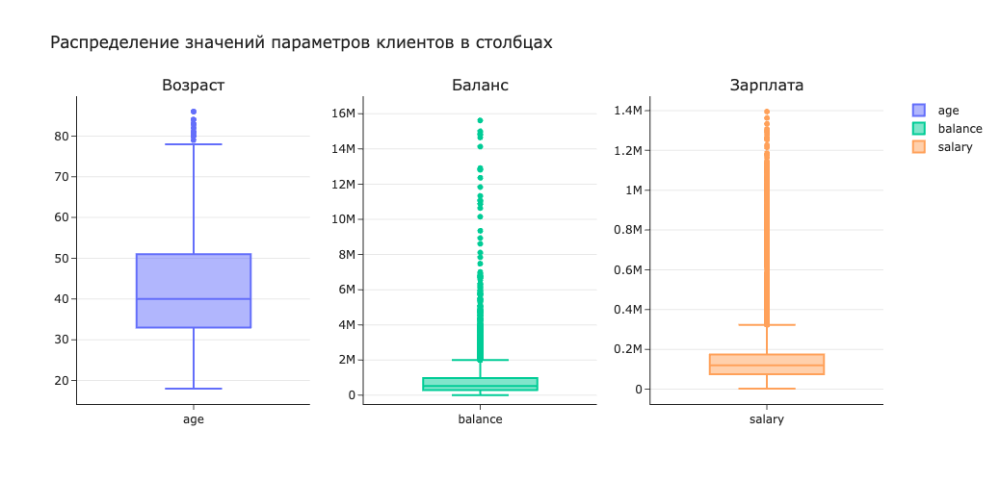

In [9]:
# Посмотрим на распределение значений в столбцаx, которые имеют непрерывный тип данных(age, balance, salary)

# Создадим и настроим графики
fig = make_subplots(rows=1, cols=3, subplot_titles=['Возраст', 'Баланс', 'Зарплата'])

fig.add_trace(go.Box(y=data.age, name='age', marker_color=px.colors.qualitative.Plotly[0]), row=1, col=1)
fig.add_trace(go.Box(y=data.balance, name='balance', marker_color=px.colors.qualitative.Plotly[2]), row=1, col=2)
fig.add_trace(go.Box(y=data.salary, name='salary', marker_color=px.colors.qualitative.Plotly[4]), row=1, col=3)

fig.update_yaxes(showgrid=True)
fig.update_yaxes(range=[-5e+5, 17e+6], tickvals=np.arange(0, 25e+6, 2e+6), row=1, col=2)

fig.update_layout(height=500, title_text='Распределение значений параметров клиентов в столбцах', template='simple_white')


fig.show()

In [10]:
# Мы видим большое кол-во выбросов в столбцах balance и salary и немного в age, ограничим их
data = data[data.age < 70].reset_index(drop=True)
data = data.drop(data.query('balance > 3000000').index).reset_index(drop=True)
data = data.drop(data.query('salary > 600000').index).reset_index(drop=True)

# Также ограничим минимальную ЗП примерным МРОТом прошлого года
data = data.drop(data.query('salary < 18000').index).reset_index(drop=True) 
check_rows() 

Всего строк 9303.
Было удаленно 697 строк, или 6.97% от первоначального кол-ва строк.
Процент уходящих клиентов первоначально 18.2%, сейчас 18.35%


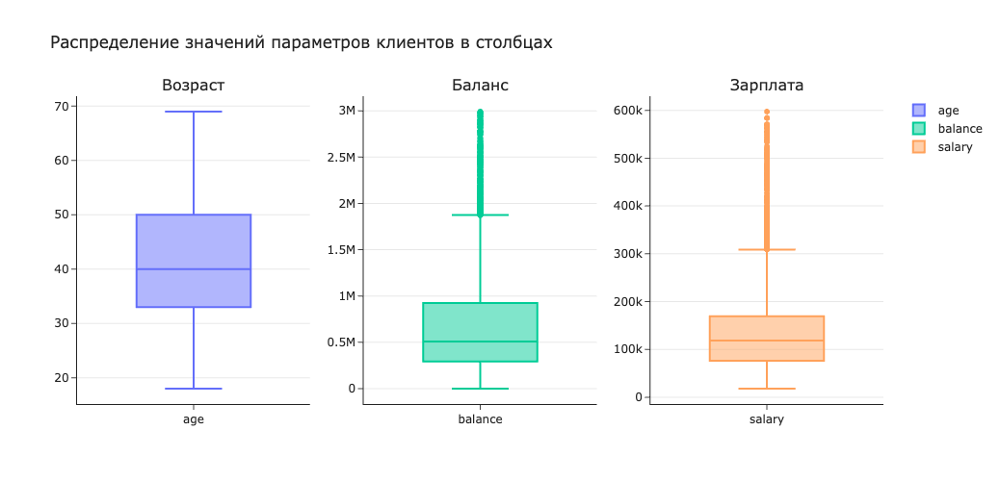

In [11]:
# Посмотрим на распределение столбцов теперь

# Создадим и настроим графики
fig = make_subplots(rows=1, cols=3, subplot_titles=['Возраст', 'Баланс', 'Зарплата'])

fig.add_trace(go.Box(y=data.age, name='age', marker_color=px.colors.qualitative.Plotly[0]), row=1, col=1)
fig.add_trace(go.Box(y=data.balance, name='balance', marker_color=px.colors.qualitative.Plotly[2]), row=1, col=2)
fig.add_trace(go.Box(y=data.salary, name='salary', marker_color=px.colors.qualitative.Plotly[4]), row=1, col=3)

fig.update_yaxes(showgrid=True)

fig.update_layout(height=500, title_text='Распределение значений параметров клиентов в столбцах', template='simple_white')


fig.show()

Выбросы еще есть в столбце balance и salary, но они уже не такие значительные.

### Обработка дубликатов <a id="Data_Preprocessing_3"></a> 

In [12]:
# Посмотрим дубликаты
print('Кол-во полных дубликатов:', data.duplicated().sum())
print('Кол-во дубликатов в столбце user_id:', data.user_id.duplicated().sum())

Кол-во полных дубликатов: 0
Кол-во дубликатов в столбце user_id: 43


In [13]:
# Посмотрим из чего состоят дубликаты в user_id

# Посмотрим процент уходящих клиентов среди всех дубликатов
data[data.user_id.duplicated(keep=False)].churn.mean()

0.5

In [14]:
# Значение 0.5 выглядит очень странно, посмотрим еще процент уходящих дубликатов первого и последнего вхождения

print(data[data.user_id.duplicated(keep='last')].churn.mean())
print(data[data.user_id.duplicated(keep='first')].churn.mean())

#Также посмотрим, кол-во строк в одном дубликате
data[data.user_id.duplicated(keep=False)].user_id.value_counts().unique()

1.0
0.0


array([2])

Мы видим, очень странные данные, а именно:
- Первое вхождение дубликата, это всегда уходящий клиент
- Второе вхождение дубликата, это всегда остающийся клиент
- Во всех дубликатав только 2 строки

Из этого можно предположить:
1. user_id уходящего человека, выдают новому человеку, а уходящего не удаляют из базы при это
2. user_id дублируется из-за ошибки при записи в БД или при его выдаче

Так как всего дубликатов немного(86), то мы можем удалить их всех.

In [15]:
# Удалим все дубликаты
data = data.drop_duplicates('user_id', keep=False).reset_index(drop=True)
check_rows() 

Всего строк 9217.
Было удаленно 783 строк, или 7.83% от первоначального кол-ва строк.
Процент уходящих клиентов первоначально 18.2%, сейчас 18.05%


### Промежуточный вывод <a id="Intermediate_output_2"></a>

1. В процессе предобработки данных были удалены строки с пропущенными значениями в столбце "age".
2. Строки с пропущенными значениями в столбце "balance" были оставлены, так как их количество составляет более 2 тысяч. Этот столбец можно использовать для анализа данных, так как средний процент уходящих клиентов среди клиентов с заполненными данными составляет около 23%, что близко к среднему проценту уходящих клиентов по всей таблице.
3. Большинство выбросов в столбцах "balance", "salary" и "age" были удалены. Осталось немного выбросов, но они уже не такие значительные.
4. Было ограничено минимальное значение в столбце "salary" примерным МРОТ прошлого года.
6. В колонке "user_id" присутствуют очень странные дубликаты: первое вхождение дубликата всегда является уходящим клиентом, а второе – всегда остающимся. Во всех дубликатах всего 2 строки. Так как количество таких дубликатов невелико (86), они были удалены.
7. Возможные причины возникновения дубликатов:
- user_id уходящего человека выдается новому человеку, но уходящего не удаляют из базы;
- user_id дублируется из-за ошибки при записи в базу данных или при его выдаче.
8. В процессе предобработки было удалено всего 783 строки, что составляет 7,83% от первоначального количества строк. Процент уходящих клиентов изменился незначительно, был 18,2%, теперь 18,05%.

- [Вернуться к содержанию проекта](#Project_content)

## Исследовательский анализ данных <a id="Data_analysis"></a> 

In [16]:
# Посмотрим на описательную статистику данных после предобработки
data.describe().round(2)

,user_id,score,age,equity,balance,products,credit_card,last_activity,salary,churn
count,9217.00,9217.00,9217.00,9217.00,7144.00,9217.00,9217.00,9217.00,9217.00,9217.00
mean,171648.84,847.02,42.07,2.62,667906.84,1.86,0.69,0.52,130849.89,0.18
std,33691.89,63.96,11.37,1.97,524272.26,0.79,0.46,0.50,76048.04,0.38
min,94561.00,642.00,18.00,0.00,0.00,1.00,0.00,0.00,18025.00,0.00
25%,142475.00,801.00,33.00,0.00,292184.86,1.00,0.00,0.00,76249.00,0.00
50%,172651.00,851.00,40.00,3.00,509958.17,2.00,1.00,1.00,118614.00,0.00
75%,200994.00,897.00,50.00,4.00,924608.03,2.00,1.00,1.00,169330.00,0.00
max,229145.00,999.00,69.00,9.00,2991887.37,5.00,1.00,1.00,597333.00,1.00


1. Средний возраст клиента банка около 43 лет
2. Среднее кол-во продуктов у одного клиента ~1.9
3. Больше половины клиентов были не активны последние 30 дней
4. Примерно 68% клиентов имеют кредитную карту банка
5. Больше половину клиентов имеет высокий кредитный рейтинг (более 850 баллов)

### Исследование распределения значений в графиках <a id="Data_analysis_1"></a> 

In [17]:
# Создадим функцию, которая будет округлять значения в столбце кратно заданому значению
def rounded(data, column, rounding):
    round_data = data.copy()
    round_data[column] = round(data[column] / rounding) * rounding
    return round_data

# Создадим функцию, которая будет по заданому столбцу создавать сводную таблицу, 
# где будет написано кол-во клиентов с одинаковым значением и процент уходящих/оставщихся
def ratio_calc(data, column, rounding=1):
    
    ratio_data = rounded(data, column, rounding).groupby(column).churn.agg(['count', 'mean']) \
                 .round(2).rename(columns={'mean': 'ratio_churn', 'count':'count_all'}).reset_index()
    
    ratio_data.ratio_churn = ratio_data.ratio_churn * 100
    ratio_data['ratio_no_churn'] = 100 - ratio_data.ratio_churn
    
    return ratio_data

In [18]:
# Создадим функцию, которая будет создавать основу для графика распределения
# по заданому столбцу с помощью сводной таблицы
def base_graf_ratio(fig, data, column, rounding):

    ratio_data = ratio_calc(data, column, rounding)

    fig.add_trace(go.Scatter(x=ratio_data[column], y=ratio_data.ratio_no_churn, line_color='#00CC96', 
                             line_shape='spline', mode='lines+markers', name='Оставшиеся клиенты'), row=1, col=1)

    fig.add_trace(go.Scatter(x=ratio_data[column], y=ratio_data.ratio_churn, line_color='#FFA15A',
                             line_shape='spline', mode='lines+markers', name='Уходящие клиенты'), row=1, col=1)

    fig.add_trace(go.Scatter(x=[-100, ratio_data[column].max() + 100], y=[18.2, 18.2], mode='lines',
                             line_color='#EF553B', line_dash='dash', name='средний % оттока (18.2%)'), row=1, col=1)

    fig.add_trace(go.Bar(x=ratio_data[column], y=ratio_data.count_all, marker_color='#636EFA',
                         name='Кол-во клиентов'), row=2, col=1)

#### Распределение клиентов по кол-ву баллов кредного скоринга

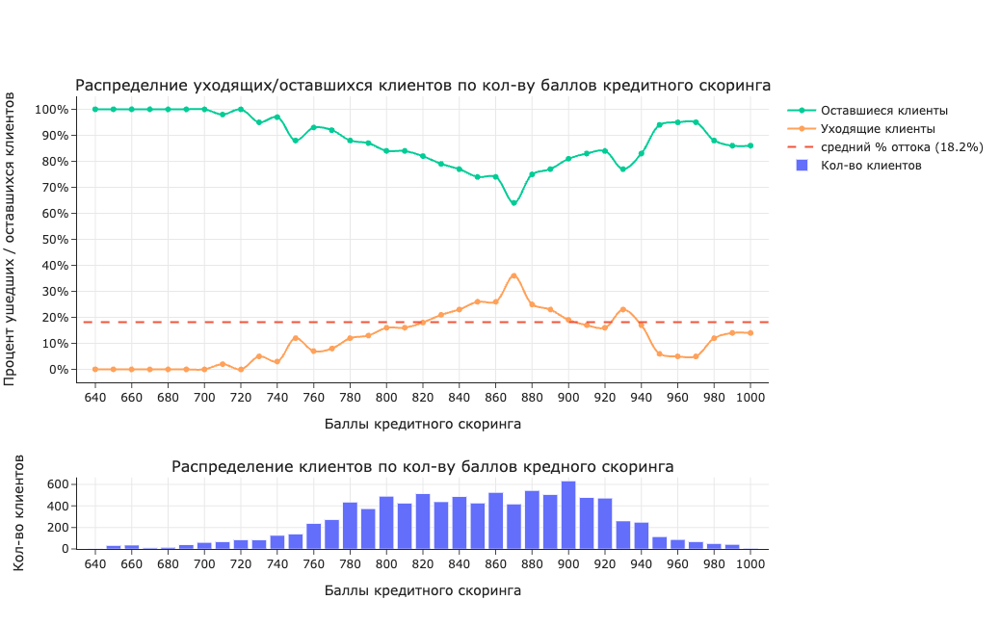

In [19]:
# Создадим графики
fig = make_subplots(rows=2, cols=1, row_heights=[0.8, 0.2], vertical_spacing=0.21,
                    subplot_titles=("Распределние уходящих/оставшихся клиентов по кол-ву баллов кредитного скоринга", 
                                    "Распределение клиентов по кол-ву баллов кредного скоринга"))

# Используем функцию для ускорения процесса
base_graf_ratio(fig, data, 'score', 10)    

# Настроим графики
fig.update_xaxes(title_text="Баллы кредитного скоринга", tickvals=np.arange(0, 1100, 20), 
                 range=[630, 1010], showgrid=True)
fig.update_yaxes(title_text="Процент ушедших / оставшихся клиентов", tickvals=np.arange(0, 110, 10), 
                 range=[-5, 105], ticksuffix='%', showgrid=True, row=1, col=1)

fig.update_xaxes(title_text="Баллы кредитного скоринга", showgrid=True, row=2, col=1)
fig.update_yaxes(title_text="Кол-во клиентов", showgrid=True, row=2, col=1)

fig.update_layout(height=650, template='simple_white', legend_font_size=12)

# Выведим графики
fig.show()

По графикам видно, что при повышении кредитного рейтинга клиента растет процент уходящих людей. Примерно после 940 баллов процент уходящих резко падает, однако это может быть и аномалией из-за малого количества клиентов с количеством баллов более 940.

Клиентов поделим на 3 категории:
1. От 0 до 820 — в этой категории находятся группы клиентов, у которых средний процент уходящих менее 18,2%.
2. 820–940 — в этой категории находятся группы клиентов, у которых средний процент уходящих выше 18,2%.
3. 940+ — в этой категории находятся группы клиентов с очень высоким рейтингом, но при этом средний процент уходящих в ней менее 18,2%.

#### Распределение клиентов по возрасту

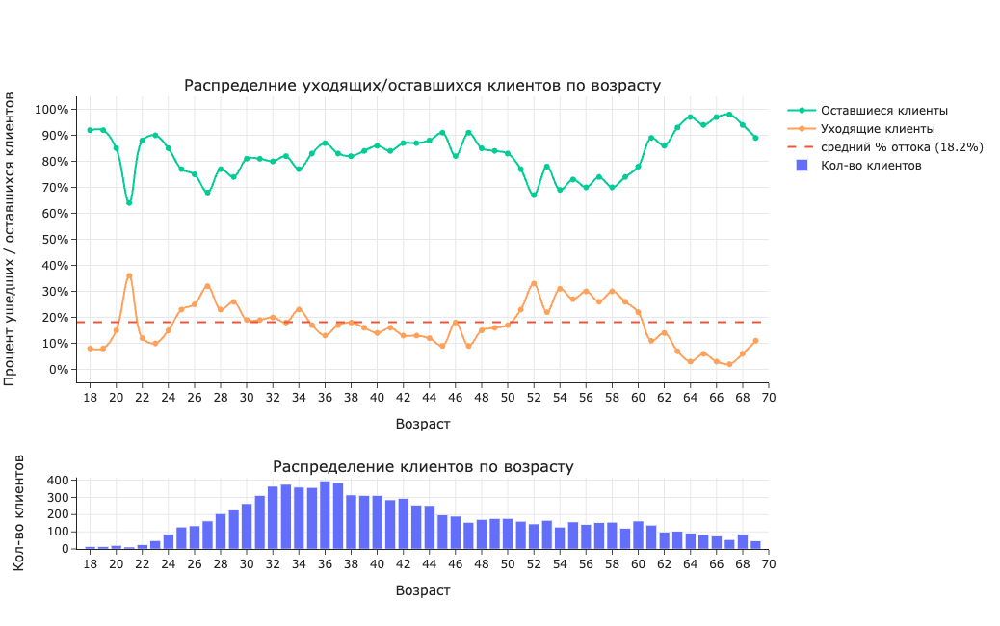

In [20]:
# Создадим графики
fig = make_subplots(rows=2, cols=1, row_heights=[0.8, 0.2], vertical_spacing=0.21, 
                    subplot_titles=("Распределние уходящих/оставшихся клиентов по возрасту", 
                                    "Распределение клиентов по возрасту"))

# Используем функцию для ускорения процесса
base_graf_ratio(fig, data, 'age', 1)    

# Настроим графики
fig.update_xaxes(title_text="Возраст", tickvals=np.arange(0, 100, 2), 
                 range=[17, 70], showgrid=True)
fig.update_yaxes(title_text="Процент ушедших / оставшихся клиентов", tickvals=np.arange(0, 110, 10), 
                 range=[-5, 105], ticksuffix='%', showgrid=True, row=1, col=1)

fig.update_xaxes(title_text="Возраст", showgrid=True, row=2, col=1)
fig.update_yaxes(title_text="Кол-во клиентов", showgrid=True, row=2, col=1)

fig.update_layout(height=650, template='simple_white', legend_font_size=12)

# Выведим графики
fig.show()

1. На графике видно, что в промежутке 18–35 процент ушедших клиентов немного выше 18,2%. Отдельно отметим 21, где виден резкий, а до и после резкий спад, это может быть аномалией или вызванной малым кол-вом данных, так как на промежуток от 18 до 22 приходится всего от 10 до 20 значений в год.
2. Далее, от 35 до 50 лет процент ушедших клиентов немного ниже 18,2%.
3. После 50 и до 60 лет видно увеличение оттока клиентов и процент ушедших клиентов немного выше 18,2%.
4. После 60 лет происходит резкий спад процента ушедших клиентов.

Столбец «Возраст» поделим на 4 категории:
- 18–35 лет;
- 36–50 лет;
- 51–60 лет;
- 61+ лет.

#### Распределение клиентов по приблизительной оценки кол-ва баллов собственности

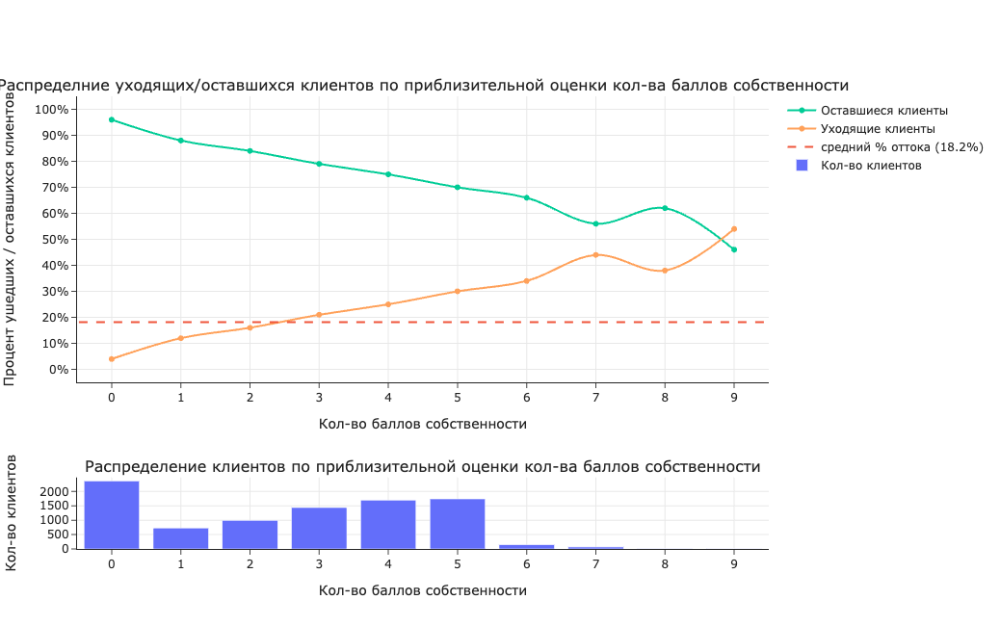

In [21]:
# Создадим графики
fig = make_subplots(rows=2, cols=1, row_heights=[0.8, 0.2], vertical_spacing=0.21,
                    subplot_titles=("Распределние уходящих/оставшихся клиентов по приблизительной оценки кол-ва баллов собственности", 
                                    "Распределение клиентов по приблизительной оценки кол-ва баллов собственности"))

# Используем функцию для ускорения процесса
base_graf_ratio(fig, data, 'equity', 1)    

# Настроим графики
fig.update_xaxes(title_text="Кол-во баллов собственности", tickvals=np.arange(0, 100, 1), 
                 range=[-0.5, 9.5], showgrid=True)
fig.update_yaxes(title_text="Процент ушедших / оставшихся клиентов", tickvals=np.arange(0, 110, 10), 
                 range=[-5, 105], ticksuffix='%', showgrid=True, row=1, col=1)

fig.update_xaxes(title_text="Кол-во баллов собственности", showgrid=True, row=2, col=1)
fig.update_yaxes(title_text="Кол-во клиентов", showgrid=True, row=2, col=1)

fig.update_layout(height=650, template='simple_white', legend_font_size=12)

# Выведим графики
fig.show()

1. С увеличением количества баллов собственности процент уходящих клиентов возрастает.
1. По графикам видно, что значительная часть людей имеет оценку количества баллов собственности равную 0, уровень оттока этой категории составляет 4%.
2. В категории клиентов с оценкой собственности 1 и 2 балла процент уходящих клиентов выше и составляет 12% и 16% соответственно.
3. В категории клиентов с 3 и более баллами собственности процент уходящих клиентов выше 18,2%, и чем больше баллов, тем выше процент оттока.
4. Клиентов с 8 и 9 баллами собственности очень мало, чтобы сделать объективную оценку уходящих, поэтому их отнесем к категории 3+.

Разделим столбец equity на 3 категории:
- 0 баллов собственности.
- 1–2 балла собственности.
- 3 и более баллов собственности.

#### Распределение клиентов по балансу

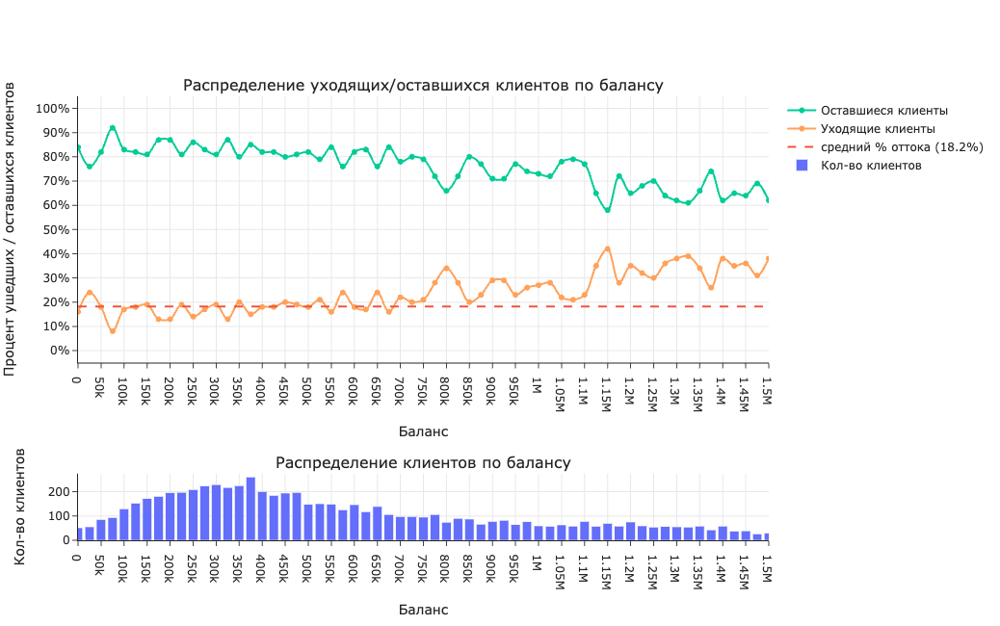

In [22]:
# Создадим графики
fig = make_subplots(rows=2, cols=1, row_heights=[0.8, 0.2], vertical_spacing=0.25,
                    subplot_titles=("Распределение уходящих/оставшихся клиентов по балансу", 
                                    "Распределение клиентов по балансу"))

# Используем функцию для ускорения процесса
base_graf_ratio(fig, data, 'balance', 25000)    

# Настроим графики
fig.update_xaxes(title_text="Баланс", tickvals=np.arange(0, 1000000000, 50000), 
                 range=[0, 1.5e+6], showgrid=True)
fig.update_yaxes(title_text="Процент ушедших / оставшихся клиентов", tickvals=np.arange(0, 110, 10), 
                 range=[-5, 105], ticksuffix='%', showgrid=True, row=1, col=1)

fig.update_xaxes(title_text="Баланс", showgrid=True, row=2, col=1)
fig.update_yaxes(title_text="Кол-во клиентов", showgrid=True, row=2, col=1)

fig.update_layout(height=650, template='simple_white', legend_font_size=12)

# Выведим графики
fig.show()

По графикам видно, что с увеличением баланса количество уходящих клиентов растет. Это особенно заметно после достижения баланса 400 тысяч и 750 тысяч рублей.

На графиках можно выделить три основные категории клиентов по балансу:
- От 0 до 400 тысяч рублей – в этой категории график относительно спокойный, большинство значений имеют процент уходящих клиентов около 18,2% или ниже.
- От 400 тысяч до 750 тысяч рублей – в этой категории большинство значений имеют процент уходящих клиентов немного выше 18,2%.
- От 750 тысяч рублей и выше – в этой категории значения имеют процент уходящих клиентов выше, а также наблюдается множество подъемов и падений(но не ниже 18,2%).

#### Распределение клиентов по кол-ву продуктов

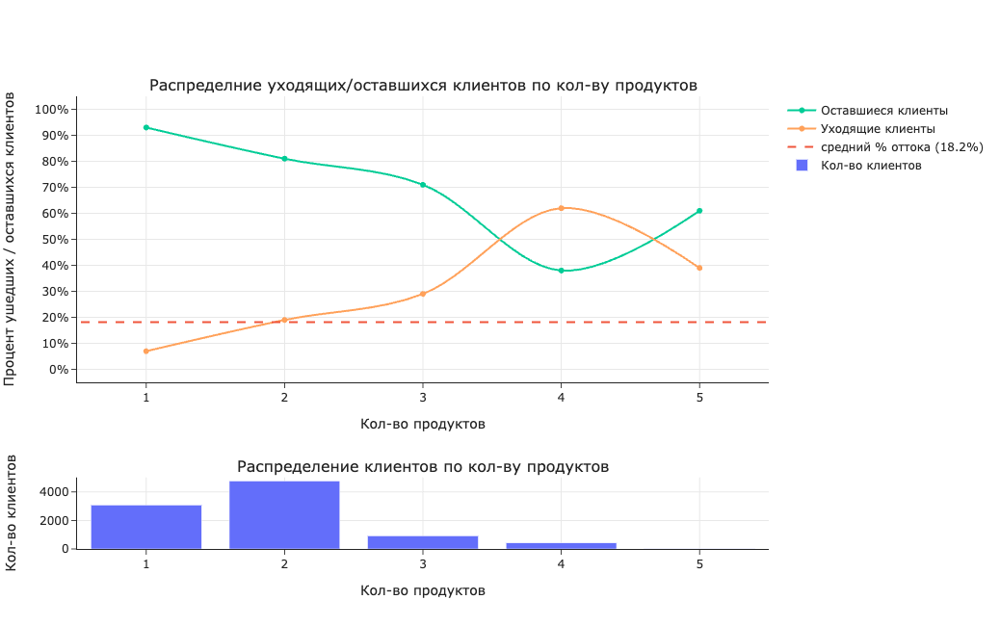

In [23]:
# Создадим графики
fig = make_subplots(rows=2, cols=1, row_heights=[0.8, 0.2], vertical_spacing=0.21,
                    subplot_titles=("Распределние уходящих/оставшихся клиентов по кол-ву продуктов", 
                                    "Распределение клиентов по кол-ву продуктов"))

# Используем функцию для ускорения процесса
base_graf_ratio(fig, data, 'products', 1)    

# Настроим графики
fig.update_xaxes(title_text="Кол-во продуктов", tickvals=np.arange(0, 100, 1), 
                 range=[0.5, 5.5], showgrid=True)
fig.update_yaxes(title_text="Процент ушедших / оставшихся клиентов", tickvals=np.arange(0, 110, 10), 
                 range=[-5, 105], ticksuffix='%', showgrid=True, row=1, col=1)

fig.update_xaxes(title_text="Кол-во продуктов", showgrid=True, row=2, col=1)
fig.update_yaxes(title_text="Кол-во клиентов", showgrid=True, row=2, col=1)

fig.update_layout(height=650, template='simple_white', legend_font_size=12)

# Выведим графики
fig.show()

По графику видно, что с увеличением количества продуктов процент уходящих клиентов растет. Разделим столбец products на категории:
- 1 продукт – процент уходящих клиентов в данной категории составляет 7%.
- 2 продукта – процент уходящих клиентов в этой категории равен 19%.
- 3 и более продукта – объединим 3, 4 и 5 продуктов, так как они являются небольшими категориями. Процент уходящих клиентов в этих категориях составляет 29%, 62% и 39% соответственно.

#### Распределение клиентов по зарплате

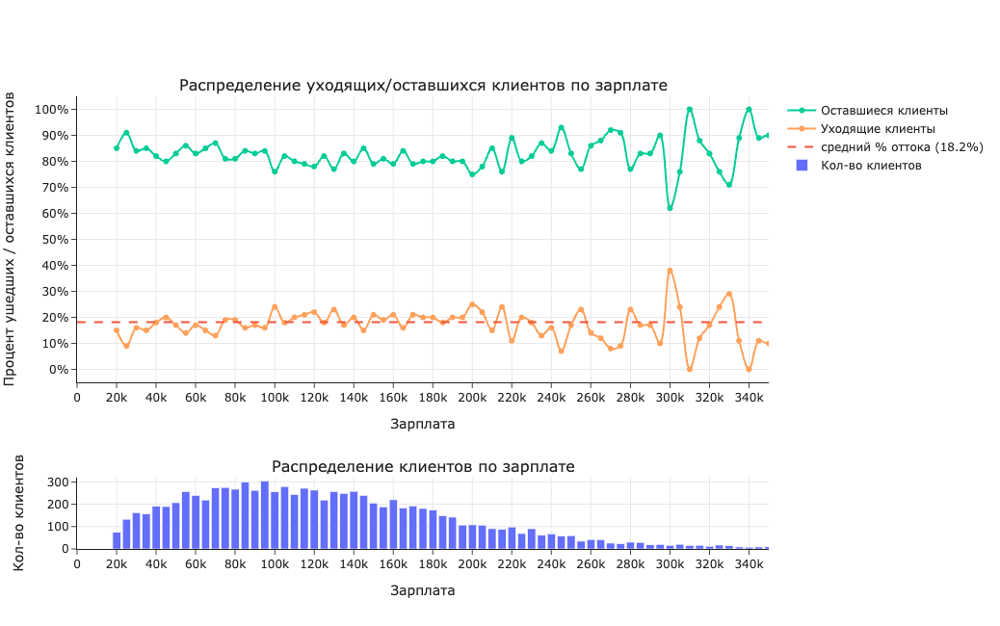

In [24]:
# Создадим графики
fig = make_subplots(rows=2, cols=1, row_heights=[0.8, 0.2], vertical_spacing=0.21,
                    subplot_titles=("Распределение уходящих/оставшихся клиентов по зарплате", 
                                    "Распределение клиентов по зарплате"))

# Используем функцию для ускорения процесса
base_graf_ratio(fig, data, 'salary', 5000)    

# Настроим графики
fig.update_xaxes(title_text="Зарплата", tickvals=np.arange(0, 1000000000, 20000), 
                 range=[0, 350000], showgrid=True)
fig.update_yaxes(title_text="Процент ушедших / оставшихся клиентов", tickvals=np.arange(0, 110, 10), 
                 range=[-5, 105], ticksuffix='%', showgrid=True, row=1, col=1)

fig.update_xaxes(title_text="Зарплата", showgrid=True, row=2, col=1)
fig.update_yaxes(title_text="Кол-во клиентов", showgrid=True, row=2, col=1)

fig.update_layout(height=650, template='simple_white', legend_font_size=12)

# Выведим графики
fig.show()

График распределения уходящих/оставшихся клиентов в зависимости от заработной платы выглядит достаточно стабильно до значения 220 тысяч рублей. После этого значения наблюдаются резкие скачки вверх и вниз. Также стоит отметить, что в диапазоне от 0 до 100 тысяч рублей процент уходящих клиентов чаще всего составляет около 18,2% или меньше. В диапазоне от 100 до 220 тысяч рублей процент уходящих клиентов чаще всего составляет около 18,2% или больше.

Поделим столбец salary на три категории:
- 0 – 100 тысяч рублей;
- 100 – 220 тысяч рублей;
- 220 тысяч и больше.

### Категоризация данных <a id="Data_analysis_2"></a> 
Создадим новые столбцы и распределим данные по категория, определеным выше.

In [25]:
# Создадим новую таблицу с категоризированными данными
data_seg = data.copy()

# Распределяем данные по категориям
data_seg['score_seg'] = pd.cut(data_seg.score, bins=[0, 820, 940, 1000], labels=['0-820', '821-940', '941+'])

data_seg['age_seg'] = pd.cut(data_seg.age, bins=[17, 35, 50, 60, 100], labels=['18-35', '36-50', '51-60', '61+'])

data_seg['equity_seg'] = pd.cut(data_seg.equity, bins=[-1, 0, 2, 10], labels=['0', '1-2', '3+'])

data_seg['balance_seg'] = pd.cut(data_seg.balance, bins=[0, 400000, 750000, data_seg.balance.max()], 
                                labels=['0-400k', '400k-750k', '750k+'])

data_seg['products_seg'] = pd.cut(data_seg.products, bins=[0, 1, 2, 10], labels=['1', '2', '3+'])

data_seg['salary_seg'] = pd.cut(data_seg.salary, bins=[0, 100000, 220000, data_seg.salary.max()], 
                                labels=['0-100k', '100k-220k', '220k+'])

data_seg.head()

,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,salary,churn,score_seg,age_seg,equity_seg,balance_seg,products_seg,salary_seg
0,183012,850,Рыбинск,Ж,25,1,59214.82,2,0,1,75719,1,821-940,18-35,1-2,0-400k,2,0-100k
1,146556,861,Рыбинск,Ж,37,5,850594.33,3,1,0,86621,0,821-940,36-50,3+,750k+,3+,0-100k
2,120722,892,Рыбинск,Ж,30,0,NaN,1,1,1,107683,0,821-940,18-35,0,NaN,1,100k-220k
3,225363,866,Ярославль,Ж,51,5,1524746.26,2,0,1,174423,1,821-940,51-60,3+,750k+,2,100k-220k
4,157978,730,Ярославль,М,34,5,174.00,1,1,0,67353,1,0-820,18-35,3+,0-400k,1,0-100k


### Исследование распределения значений в таблицах <a id="Data_analysis_3"></a> 

#### Иследование распределения значений в таблицах категоризированных данных

In [26]:
#Создадим функцию для создания сводной таблицы для категоризированных данных и просмотра процента уходящих клиентов
def fast_pivot(data, columns, new_name):
    ratio_data = pd.pivot_table(data, index=columns, columns='churn', values='user_id', aggfunc='count').reset_index()
    
    ratio_data.insert(1, 'count_all', ratio_data[0] + ratio_data[1])
    ratio_data[0] = round(ratio_data[0] / ratio_data.count_all * 100, 1)
    ratio_data[1] = round(ratio_data[1] / ratio_data.count_all * 100, 1)
    
    ratio_data = ratio_data[[columns, 'count_all', 1, 0]]
    return ratio_data.rename(columns={columns:new_name, 'count_all':'кол-во клиентов',
                             1:'% уходящих клиентов', 0:'% оставщихся клиентов'})

In [27]:
# Исследуем распределение значений
print('Был ли активен клиент за последние 30 дней:')
fast_pivot(data_seg, 'last_activity', 'активный ли клиент').replace([0, 1], ['Не активный', 'Активный'])

Был ли активен клиент за последние 30 дней:


churn,активный ли клиент,кол-во клиентов,% уходящих клиентов,% оставщихся клиентов
0,Не активный,4434,11.3,88.7
1,Активный,4783,24.3,75.7


Количество клиентов активных и неактивных примерно равно.
По таблице видно, что среди клиентов, которые были неактивны, являются уходящими ~24,3%.
Среди клиентов, которые были активны, являются уходящими только ~11,3%.

In [28]:
# Исследуем распределение значений
print('Есть ли у клиента кредитка:')
fast_pivot(data_seg, 'credit_card', 'наличие кредитки').replace([0, 1], ['Нет кредитки', 'Есть кредитка'])

Есть ли у клиента кредитка:


churn,наличие кредитки,кол-во клиентов,% уходящих клиентов,% оставщихся клиентов
0,Нет кредитки,2903,25.2,74.8
1,Есть кредитка,6314,14.8,85.2


Кол-во клиентов с кредиткой примерно в 2 раза больше, чем клиентов без кредиток.
Среди клиентов без кредиток 25,2% являются уходящими.
Среди клиентов с кредиткой 14,8% являются уходящими.

In [29]:
# Исследуем распределение значений
print('Пол клиента:')
fast_pivot(data_seg, 'gender', 'пол')

Пол клиента:


churn,пол,кол-во клиентов,% уходящих клиентов,% оставщихся клиентов
0,Ж,4546,13.0,87.0
1,М,4671,23.0,77.0


Количество клиентов мужского и женского пола примерно равно.
По таблице видно, что среди клиентов мужского пола уходящими являются ~23%.
Среди клиентов женского пола уходящими являются 13%.

In [30]:
# Исследуем распределение значений
print('Город клиента:')
fast_pivot(data_seg, 'city', 'город')

Город клиента:


churn,город,кол-во клиентов,% уходящих клиентов,% оставщихся клиентов
0,Ростов,1344,19.0,81.0
1,Рыбинск,2476,15.9,84.1
2,Ярославль,5397,18.8,81.2


В городах Ростов и Ярославль процент уходящих клиентов чуть выше среднего и равен 19% и 18,8% соответственно.
В Рыбинске процент уходящих клиентов ниже среднего и равен 15,9%.

#### Иследование распределения значений в таблицах новых категоризированных данных
Также теперь посмотрим на новые столбцы с категоризированными данными

In [31]:
# Исследуем распределение новых категоризированых значений 
columns = ['score_seg', 'age_seg', 'equity_seg', 'balance_seg', 'products_seg', 'salary_seg']

for column in columns:
    display(fast_pivot(data_seg, column, column))

churn,score_seg,кол-во клиентов,% уходящих клиентов,% оставщихся клиентов
0,0-820,3185,11.2,88.8
1,821-940,5563,22.7,77.3
2,941+,469,9.6,90.4


churn,age_seg,кол-во клиентов,% уходящих клиентов,% оставщихся клиентов
0,18-35,3097,20.7,79.3
1,36-50,3863,14.7,85.3
2,51-60,1486,26.9,73.1
3,61+,771,7.4,92.6


churn,equity_seg,кол-во клиентов,% уходящих клиентов,% оставщихся клиентов
0,0,2365,3.6,96.4
1,1-2,1726,14.4,85.6
2,3+,5126,26.0,74.0


churn,balance_seg,кол-во клиентов,% уходящих клиентов,% оставщихся клиентов
0,0-400k,2759,16.4,83.6
1,400k-750k,2003,19.1,80.9
2,750k+,2380,34.4,65.6


churn,products_seg,кол-во клиентов,% уходящих клиентов,% оставщихся клиентов
0,1,3083,7.2,92.8
1,2,4772,19.0,81.0
2,3+,1362,39.4,60.6


churn,salary_seg,кол-во клиентов,% уходящих клиентов,% оставщихся клиентов
0,0-100k,3637,16.4,83.6
1,100k-220k,4583,20.0,80.0
2,220k+,997,15.1,84.9


В созданных столбцах с категориальными данными можно отметить следующее:

- В столбце с кредитным рейтингом, категория 821–940 имеет процент уходящих клиентов, который равен 22,7%, что выше среднего значения.
- В столбце с возрастом, категории 18–35 и 51–60 имеют процент уходящих клиентов 20,7% и 26,9% соответственно.
- Категория, в которой клиенты с 3 и более баллами собственности имеют больший процент уходящих клиентов (26%).
- Категория, в которой клиенты с высоким балансом (400–750 тысяч) и с очень высоким балансом (750 тысяч и более) имеют высокий процент уходящих клиентов (19,1% и 34,4%).
- Категория, в которой клиенты имеют 2 и 3+ продукта банка, имеет процент уходящих 19% и 39,4% соответственно.
- Категория, в которой клиенты имеют зарплату 100–220 тысяч, имеет процент уходящих 20%.

### Кореляция <a id="Data_analysis_4"></a> 

In [32]:
# Сначала посмотрим на кореляцию параметров без упорядочемых столбцов
data.corr().replace(1, 0).loc['churn'].sort_values(ascending=False) \
.round(2).reset_index().style.background_gradient(cmap='BuGn', axis=0)

,index,churn
0,products,0.290000
1,equity,0.260000
2,balance,0.220000
3,last_activity,0.170000
4,score,0.090000
5,salary,0.000000
6,churn,0.000000
7,user_id,-0.020000
8,age,-0.030000
9,credit_card,-0.130000


Мы видим, что параметр churn имеет слабую корреляцию со столбцами equity, balance, products и last_activity. Это подтверждают графики и таблицы, которые расположены выше. Когда значения в этих столбцах увеличиваются, количество уходящих клиентов также увеличивается.

In [33]:
# Теперь посмотрим на матрицу кореляции, где будут закодированны упорядочемые столбцы
data.phik_matrix().replace(1, 0).loc['churn'].sort_values(ascending=False) \
.round(2).reset_index().style.background_gradient(cmap='BuGn', axis=0)

interval columns not set, guessing: ['user_id', 'score', 'age', 'equity', 'balance', 'products', 'credit_card', 'last_activity', 'salary', 'churn']


,index,churn
0,equity,0.340000
1,balance,0.300000
2,last_activity,0.260000
3,products,0.250000
4,score,0.230000
5,gender,0.200000
6,credit_card,0.200000
7,age,0.180000
8,user_id,0.150000
9,salary,0.050000


Мы видим, что параметр churn имеет среднюю корреляцию с столбцами equity и balance, а также слабую корреляцию с столбцами products, last_activity. Эти данные подтверждает матрица корреляции, представленная сверху.

Кроме того, в этой таблице можно заметить слабую корреляцию в столбцах score, credit_card и gender. Это подтверждают графики и таблицы, представленные выше. Согласно этим данным, при повышении значений в этих столбцах, количество уходящих клиентов увеличивается. Однако, это не относится к столбцу score. 

### Промежуточный вывод <a id="Intermediate_output_3"></a>

**Подведем итоги по каждому столбцу:**

**score / количество баллов кредитного скоринга** 

В данном столбце видно, что с увеличением количества баллов число уходящих клиентов сначала растет, а затем снижается. Наибольшее количество уходящих клиентов находится в промежутке от 821 до 940 баллов, а средний процент уходящих в этом промежутке составляет 22,7%.

**age / возраст** 

В данном столбце можно выделить две категории: 18-35 и 51-60 лет, с высоким процентом уходящих клиентов (20,7% и 26,9% соответственно).

**equity / приблизительная оценка количества баллов собственности** 

С увеличением количества баллов собственности процент уходящих клиентов возрастает. Это подтверждают графики, сводные таблицы и расчет корреляции. Категория, где клиенты имеют 3 и более баллов собственности, имеет наибольший процент уходящих клиентов (26%). В то же время, категория, где клиенты с 0 баллами собственности, имеет наименьший процент уходящих (4%).

**balance / баланс на счете**

По графику видно, что с увеличением количества продуктов процент уходящих клиентов немного растет. Это подтверждают графики, сводные таблицы и расчет корреляции. Категория, в которой клиенты с высоким балансом (400-750 тысяч) и очень высоким балансом (750 тысяч и более), имеет высокий процент уходящих клиентов (19,1% и 34,4%).

**products / количество продуктов, которыми пользуется клиент**

По графику видно, что с увеличением количества продуктов процент уходящих клиентов растет. Это подтверждают графики, сводные таблицы и расчет корреляции. Категория, в которой клиенты имеют 1 продукт банка, имеет наименьший процент уходящих – 7%. Категория, в которой клиенты имеют 2 и 3+ продукта банка, имеет процент уходящих 19% и 39,4% соответственно.

**salary / оценочный доход клиента**

График распределения уходящих/оставшихся клиентов в зависимости от заработной платы выглядит стабильно до значения 220 тысяч рублей. После этого значения наблюдаются резкие скачки вверх и вниз. Категория, в которой клиенты имеют зарплату 100-220 тысяч, имеет процент уходящих 20%. Остальные категории имеют процент уходящих примерно ~16%. Можно сказать, что уровень заработной платы имеет низкое влияние на процент уходящих.

**credit_card / есть ли кредитная карта**

Количество клиентов с кредиткой примерно в 2 раза больше, чем клиентов без кредиток. Среди клиентов без кредиток 25,2% являются уходящими. Среди клиентов с кредиткой 14,8% являются уходящими.

**city / город**

Больше половины клиентов проживают в Ярославле. В городах Ростов и Ярославль процент уходящих клиентов немного выше среднего и равен 19% и 18,8% соответственно. В Рыбинске процент уходящих клиентов ниже среднего и равен 15,9%. Можно сказать, что город проживания почти не влияет на процент уходящих.

**gender / пол**

Количество клиентов мужского и женского пола примерно одинаково. По таблице видно, что среди клиентов мужского пола уходящими являются ~23%. Среди клиентов женского пола уходящими являются 13%.

**last_activity / активный клиент**

Количество активных и неактивных клиентов примерно одинаково. По таблице видно, что среди клиентов, которые были неактивны, являются уходящими ~24,3%. Среди клиентов, которые были активны, являются уходящими только ~11,3%.

**Вывод**
Почти все параметры, кроме salary и city, могут оказывать значительное влияние на процент уходящих клиентов при сегментации. Также следует отметить, что при увеличении показателей equity, balance, products, может существенно повысить вероятность ухода клиента.

- [Вернуться к содержанию проекта](#Project_content)

### Предварительный вывод <a id="Intermediate_output_3_1"></a>
На данный момент можно предположить, что клиентами банка, которые могут прекратить его использование, являются люди, относящиеся к одной или нескольким из следующих категорий:

- мужчины в возрасте от 18 до 35 или от 51 до 60 лет;
- клиенты со средним или высоким кредитным рейтингом (от 821 до 940);
- клиенты с большим балансом на счете (от 400 тысяч рублей);
- клиенты, имеющие высокую оценку количества баллов собственности (от 3 и выше);
- клиенты, которые пользуются двумя и более продуктами банка;
- клиенты, у которых нет кредитной карты банка;
- клиенты, которые не проявляли активность в банковском приложении в течение последних 30 дней.

То есть, мы можем сказать, что это достаточно обеспеченный человек с хорошим капиталом и ответственным отношением к деньгам. Следовательно, нам необходимо предложить новые продукты и сервисы для этого типа людей. Это могут быть, например, премиальные карты, специальное обслуживание, более выгодные условия для вкладов и различные страховки для имущества. 

Также важно напомнить этому человеку о банке, чтобы он захотел продолжить пользоваться им и приобрести новые продукты и сервисы. 

- [Вернуться к содержанию проекта](#Project_content)

## Проверка гипотез <a id="Hypothesis_test"></a> 

Проверим следующие гипотезы:
1. Присутствует различие дохода между теми клиентами, которые ушли, и теми, которые остались. Колонка salary.
2. Присутствует различие баланса на счете между теми клиентами, которые ушли, и теми, которые остались. Колонка balance.
3. Присутствует различие баллов кредитного скоринга между теми клиентами, которые ушли, и теми, которые остались. Колонка score.

Сформулируем нулевую и альтернативную гипотезу для всех:
- Нулевая: различий в среднем значении колонки между остающимися и уходящими клиентами нет.
- Альтернативная: различий в среднем значении колонки между остающимися и уходящими клиентами есть.

Для проверки гипотез будем использовать t-тест Стьюдента. Он подходит для сравнения количественных признаков двух независимых выборок с нормальным распределением, что соотвествует нашим данным. Уровень статистических данных установим = 0.01

In [34]:
# Создадим функцию для проверки гипотез
def stat_calc(data, column, alpha=0.01):
    
    # Задаем уровень статистической значимости
    alpha = alpha 

    data_no_churn = data.query('churn == 0 and @data[@column].notna()')[column]
    data_churn = data.query('churn == 1 and @data[@column].notna()')[column]


    # Выводим среднее значение параметра
    print(f'''Среднее значение колонки {column} у оставшегося клиента: {data_no_churn.mean():.1f}, \
у уходящего клиента: {data_churn.mean():.1f}.''')

    # Производим статистический анализ и выводим его результаты
    results = st.ttest_ind(data_no_churn, data_churn)
    print(f'P-value равен: {results.pvalue}')

    # Сравниваем p-value с уровнем статистической значимости
    if results.pvalue < alpha:
        print('Отвергаем нулевую гипотезу о равенстве среднего значения колонки между остающимися и уходящими клиентами.')
    else:
        print('Нет основний отвергнуть нулевую гипотезу.')

In [35]:
# Проверим гипотезы
columns = ['salary', 'balance', 'score']

for column in columns:
    print('-'*80)
    print(f'Колонка {column}:')
    stat_calc(data, column, 0.01)       

--------------------------------------------------------------------------------
Колонка salary:
Среднее значение колонки salary у оставшегося клиента: 130767.5, у уходящего клиента: 131223.8.
P-value равен: 0.8246497168431082
Нет основний отвергнуть нулевую гипотезу.
--------------------------------------------------------------------------------
Колонка balance:
Среднее значение колонки balance у оставшегося клиента: 604313.2, у уходящего клиента: 878988.5.
P-value равен: 9.256186558764893e-80
Отвергаем нулевую гипотезу о равенстве среднего значения колонки между остающимися и уходящими клиентами.
--------------------------------------------------------------------------------
Колонка score:
Среднее значение колонки score у оставшегося клиента: 844.3, у уходящего клиента: 859.5.
P-value равен: 1.2937610096463899e-18
Отвергаем нулевую гипотезу о равенстве среднего значения колонки между остающимися и уходящими клиентами.


### Промежуточный вывод <a id="Intermediate_output_4"></a>

1. Между теми, кто остается, и теми, кто уходит, нет статистической разницы в уровне зарплаты. Средние значения зарплаты в обеих группах примерно равны.
2. Между теми, кто остается, и теми, кто уходит, есть статистическая разница в балансе на счете. Средние значения баланса на счете у уходящих клиентов почти в 1,5 раза больше.
3. Между теми, кто остается, и теми, кто уходит, есть статистическая разница в количестве баллов кредитного скоринга. Средние значения количества баллов кредитного скоринга немного выше.

- [Вернуться к содержанию проекта](#Project_content)

## Сегментации клиентов и их анализ <a id="Customer_segment"></a> 

Создадим функцию, которая позволит группировать клиентов по заданным категориям(column_group) и рассчитывать количество клиентов в каждой группе, а также процент уходящих клиентов.

Если необходимо, функция будет добавлять названия колонок к каждой категории и обезличивать сами колонки(rename_columns). Кроме того, к каждой группе можно будет добавить список user_id всех(all_user_id) и/или только уходящих клиентов(churn_user_id).

Также добавим параметры для отсеивания очень маленьких групп(min_count) и групп с низким процентом уходящих клиентов(min_avr).

In [36]:
# Создаем функцию

def fast_group(column_group, min_avr, min_count, rename_columns=False, churn_user_id=False, all_user_id=False):
    
    # Создаем сгрупированную таблицу по заданым параметрам
    if all_user_id:
        data_group = data_seg.groupby(column_group) \
                     .agg({'age':'count', 'churn':'mean', 'user_id':'unique'}) \
                     .query('churn > @min_avr & age > @min_count').reset_index()
    else:
        data_group = data_seg.groupby(column_group) \
                     .agg({'age':'count', 'churn':'mean'}) \
                     .query('churn > @min_avr & age > @min_count').reset_index()
    
    # Переименовываем столбцы
    data_group = data_group.rename(columns={'churn':'ratio_churn', 'age':'count', 'user_id':'all_user_id'})
    
    # Считаем кол-во ушедших
    data_group['count_churn'] = (data_group['count'] * data_group['ratio_churn']).astype('int64')
    
    # Округляем значения
    data_group['ratio_churn'] = (data_group['ratio_churn'] * 100).round(1)
    
    # При необходимости добавляем для каждой группы список уникальных id ушедших клиентов
    if churn_user_id:
        data_group = data_group.merge(data_seg.query('churn == 1') \
                                      .groupby(column_group)['user_id'].unique() \
                                      .reset_index(), how='left', on=column_group)
    
    # Обезличиваем при необходимости     
    if rename_columns:
        for index, column in enumerate(column_group[:len(data_group.columns) - 2]):
            data_group[column] = column + ': ' + data_group[column].astype('str')
            data_group = data_group.rename(columns={column:('column_' + str(index))})
    
    
    # Возвращаем
    return data_group

Так как у нас 10 столбцов, в каждом из которых по несколько категорий, то для поиска нужных группы вручную нам понадобиться много времени, поэтому создадим функцию.

Создадим функцию, которая будет группировать(используя функцию выше fast_group) все сочетания заданных колонок(columns) в заданном количестве(cols) и присоеденять их друг к другу. Остальные параметры в функции такие же, как и в функции(fast_group) выше и нужны для управление ей. 

In [37]:
# Создаем функцию
def group_data_seg(columns, cols, min_avr, min_count, rename_columns=False, churn_user_id=False, all_user_id=False):
    
    # Создаем пустой датафрейм
    data_grouped = pd.DataFrame()
    
    # Создаем список сочетания колонок заданого размера и проходимся по нему
    for column_group in list(itertools.combinations(columns, cols)):
        
        # Исполльзуем функцию, чтобы создать сгрупированную таблицу
        data_group = fast_group(list(column_group), min_avr, min_count, rename_columns, churn_user_id, all_user_id)
        
        # Добавляем к датафрейму сгрупированую таблицу
        data_grouped = pd.concat([data_grouped, data_group])
       
    # Сортируем по кол-ву уходящих людей, так мы получим сверху группы, 
    # в которых находится наибольшее кол-во людей мы можем потерять.
    data_grouped = data_grouped.sort_values('count_churn', ascending=False).reset_index(drop=True)
    
    # Меняем местами колонкам для более удобного чтения данных
    columns_to_swap = list(data_grouped.columns[cols:cols+all_user_id+churn_user_id+rename_columns+3])
    column_to_return = list(data_grouped.columns[0:cols]) + \
                       list(data_grouped.columns[len(columns_to_swap)+cols:]) + columns_to_swap
    column_to_return[-2], column_to_return[-3] = column_to_return[-3], column_to_return[-2]
    
    # Возвращаем таблицу
    return data_grouped[column_to_return]

### Создание высокоточных групп пользователей из 5 параметров <a id="Customer_segment_1"></a> 

In [38]:
# Создадим таблицу высокоточных групп состоящих из 5 параметров, 
# минимальный размер групп будет 500 клиентов, а минимальный процент уходящих 18%

columns = ['city', 'gender', 'credit_card', 'last_activity', 'score_seg', 
'age_seg', 'equity_seg', 'balance_seg', 'products_seg', 'salary_seg']

df_five_parametr = group_data_seg(columns=columns, cols=5, min_avr=0.18, 
                                  min_count=500, rename_columns=False, churn_user_id=True, all_user_id=True)

print('Кол-во строк в таблице:', df_five_parametr.shape[0])

# Выведим таблицу, скрыв строки с уникальными id в группах, и заменим пропуски на прочерк для более удобного чтения
df_five_parametr.iloc[:, :-2].fillna('-').head(10)

Кол-во строк в таблице: 57


,city,gender,credit_card,last_activity,score_seg,age_seg,equity_seg,balance_seg,products_seg,salary_seg,count,ratio_churn,count_churn
0,-,-,-,1.0,821-940,-,3+,750k+,-,100k-220k,510,65.9,336
1,-,-,0.0,1.0,821-940,-,3+,-,2,-,506,61.1,309
2,Ярославль,-,-,-,821-940,-,3+,750k+,-,100k-220k,592,51.2,303
3,-,-,-,1.0,821-940,-,3+,750k+,2,-,534,56.0,299
4,-,-,-,1.0,821-940,-,3+,-,2,100k-220k,536,55.6,298
5,-,М,-,-,821-940,-,3+,750k+,-,100k-220k,525,55.0,289
6,Ярославль,М,-,-,821-940,-,3+,750k+,-,-,513,55.0,282
7,Ярославль,-,-,1.0,821-940,-,3+,-,2,-,501,55.7,279
8,Ярославль,-,1.0,1.0,821-940,-,3+,-,-,-,545,49.9,272
9,-,-,-,-,821-940,-,3+,750k+,2,100k-220k,629,40.2,253


Ознакомиться с полной таблицей можно по [ссылке](https://docs.google.com/spreadsheets/d/1ACfl1_tggwL0O9VJ1nxFP-vZZaZO1A8X-YLTgpYdG2I/edit?usp=sharing).

In [39]:
# Также посмотрим, как часто встречается, каждая категория из параметров групп. 
# Чтобы удобнее это сделать создадим такую же таблицу, но теперь обезличив колонки

df_five_parametr_dep = group_data_seg(columns=columns, cols=5, min_avr=0.18, 
                                      min_count=500, rename_columns=True, churn_user_id=True, all_user_id=True)

df = pd.DataFrame()

for index in range(5):
    df = pd.concat([df, df_five_parametr_dep.iloc[:, index]])

df[0].value_counts().reset_index()

,index,0
0,score_seg: 821-940,47
1,equity_seg: 3+,46
2,city: Ярославль,34
3,credit_card: 1,32
4,products_seg: 2,28
5,salary_seg: 100k-220k,26
6,gender: М,25
7,last_activity: 1,14
8,balance_seg: 750k+,12
9,gender: Ж,6


Всего получилось 57 групп, каждая из которых имеет 5 признаков. По таблицам видно, что большинство групп состоит из одинаковых категорий, например: score_seg(821-940), equity_seg(3+) и city(Ярославль), credit_card(1) и тд. Можно сказать, что если взять вместе первые 5 групп, то пользователи в них будут пересекаться. Поэтому для приоритизации групп будем использовать другой способ.

In [40]:
# Посмотрим, сколько уникальный уходящих пользователей среди первых пяти групп
unique_id = set()
[unique_id.update(df_five_parametr.user_id[i]) for i in range(5)]
len(unique_id)

654

Создадим функцию, которая будет находить наилучшее сочетание групп заданного количества, чтобы получить максимальное количество уникальных id уходящих клиентов. Таким образом, мы сможем определить приоритеты для групп. Однако есть один существенный недостаток этой функции: при работе с большой таблицей и большим количеством заданных групп для поиска, функция может работать очень долго. Поэтому мы будем сначала искать топ-3 группы для начала работы маркетингового отдела.

In [41]:
# Создадим функцию
def find_optimal_rows(data, rows):

    max_unique_id = 0
    best_combination = 0

    # Пройдемся по всем возможным сочетаниям групп заданого размера
    for comb in itertools.combinations(range(data.shape[0]), rows):

        comb_set = set()

        # Посчитаем, сколько в сочетании групп уникальных id
        for index in comb:
            comb_set.update(data.loc[index, 'user_id'])

        # Если больше, чем до этого, то сочетание станет новым лучшим сочетанием
        if len(comb_set) > max_unique_id:
            max_unique_id = len(comb_set)
            best_combination = comb
    
    return best_combination, max_unique_id

In [42]:
# Найдем сочетание с максимальный кол-во уникальных id уходящих
best_combination, churn_seg_users = find_optimal_rows(df_five_parametr, 3)

# Выведем сочетание и кол-во уникальных id в нем
print(f'Лучшее сочетание {best_combination}, кол-во уникальных id уходящих клиентов {churn_seg_users}.')

Лучшее сочетание (1, 5, 8), кол-во уникальных id уходящих клиентов 723.


In [43]:
# Посмотрим сколько уникальный пользователей всего
all_seg_users = set()
[all_seg_users.update(df_five_parametr.all_user_id[i]) for i in [1, 5, 8]]
print('Уникальных клиентов в 3-х группах всего:', len(all_seg_users))

# Посмотрим, какую долю среди уходящих пользователей занимают данные 3 группы
print(f'''В данных 3-х группах, находится ~ \
{round(churn_seg_users / data.query('churn == 1').shape[0] * 100, 1)}% уходящих клиентов, от общего их количества''')

# Изучим топ-3 группы из 5 параметров
df_five_parametr.iloc[[1, 5, 8], :-2].fillna('-')

Уникальных клиентов в 3-х группах всего: 1397
В данных 3-х группах, находится ~ 43.4% уходящих клиентов, от общего их количества


,city,gender,credit_card,last_activity,score_seg,age_seg,equity_seg,balance_seg,products_seg,salary_seg,count,ratio_churn,count_churn
1,-,-,0.0,1.0,821-940,-,3+,-,2,-,506,61.1,309
5,-,М,-,-,821-940,-,3+,750k+,-,100k-220k,525,55.0,289
8,Ярославль,-,1.0,1.0,821-940,-,3+,-,-,-,545,49.9,272


Данные трех групп имеют 43,4% уходящих клиентов от общего их числа. Каждая группа состоит из чуть более 500 человек и имеет процент ухода клиентов от 50 до 61%. Все три группы имеют категории «кредитный скоринг» (821–940, score) и «оценка баллов собственности» (3 и выше, equity).

Теперь рассмотрим группы подробнее:

1. Первая группа состоит из людей без кредитной карты, которые не взаимодействовали с банком последние 30 дней. Они имеют средний или высокий кредитный рейтинг от 821 до 940 баллов, высокую оценку баллов собственности (3 и выше) и пользуются двумя продуктами банка.

2. Вторая группа состоит из мужчин с средним или высоким кредитным рейтингом от 821 до 940 баллов, высокой оценкой баллов собственности (3 и выше), балансом более 750 тысяч и зарплатой от 100 тысяч до 200 тысяч рублей.

3. Третья группа состоит из клиентов из Ярославля с кредитной картой, которые не взаимодействовали с банком последние 30 дней. Они также имеют средний или высокий кредитный рейтинг от 821 до 940 баллов и высокую оценку баллов собственности (3 и выше).

Создадим график, чтобы посмотреть доли уникальных клиентов в топ-3 выделенных сегментов среди всех клиентов.

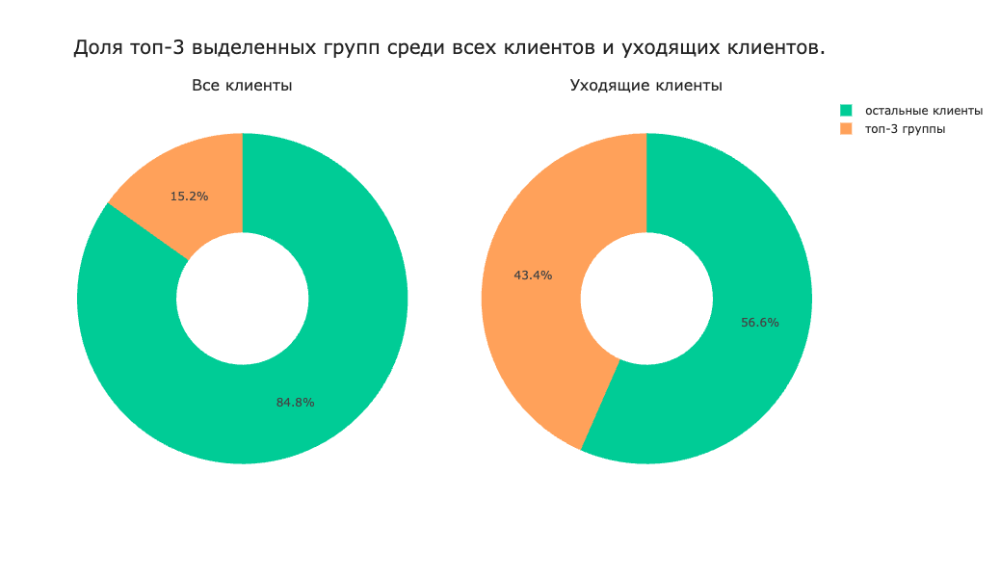

In [44]:
# Расчитаем кол-во клиентов без клиентов из топ-3 группы
churn_users = data.query('churn==1').shape[0] - churn_seg_users
all_seg_users = len(all_seg_users)
all_users = data.shape[0] - all_seg_users

# Создадим и настроим график
fig = make_subplots(rows=1, cols=2, specs=[[{"type": "pie"},{"type": "pie"}]], 
                    subplot_titles=('Все клиенты', 'Уходящие клиенты'))

fig.add_trace(go.Pie(labels=['топ-3 группы', 'остальные клиенты'], values=[all_seg_users, all_users], 
                     name=''), row=1, col=1)


fig.add_trace(go.Pie(labels=['топ-3 группы', 'остальные клиенты'], values=[churn_seg_users, churn_users], 
                     name=''), row=1, col=2)

fig.update_traces(textinfo='percent', hole=0.4, marker_colors=['#FFA15A', '#00CC96'])

fig.update_layout(height=600, template='simple_white', legend_font_size=12,
                      title={'text': 'Доля топ-3 выделенных групп среди всех клиентов и уходящих клиентов.',
                             'font_size':20, 'y':0.93, 'x':0.45, 'xanchor': 'center'})

fig.show()

По графикам мы видим, что при работе с тремя лучшими выделенными группами, в которые входит всего ~15% клиентов, мы сможем отработать ~43% уходящих клиентов.

## Вывод <a id="Conclusion"></a> 

**Признаки влияющие на повышение оттока клиентов:**

1. Увеличение показателей оценки количества баллов собственности (equity, 3 и больше), баланса (balance, от 750 тысяч и выше) и количества продуктов банка (products, 2 и больше) может существенно повысить вероятность ухода клиента.

2. Кредитный рейтинг (score) также может оказать существенное влияние, если количество баллов будет от 821 до 940.

3. Если клиент не проявлял активность в банковском приложении в течение последних 30 дней (last_activity), это также может существенно повлиять на отток.

4. Возраст клиента может оказать среднее влияние, если он находится в диапазоне от 18 до 35 или от 51 до 60 лет.

5. Пол клиента также может оказать среднее влияние: если он мужской, то вероятность оттока повышается. Кроме того, среднее влияние может оказать доход клиента, если он находится в диапазоне от 100 до 220 тысяч.

**Выделенные компактные высокоотточные сегменты:**

Было выделено 57 компактных (в среднем 550 человек на группу), высокоточных групп, каждая из которых состоит из 5 признаков. Затем была проведена приоритизация и выявлены 3 группы, которые вместе имеют долю 43,4% от всех уходящих клиентов.

Описание групп:

1. Первая группа состоит из клиентов без кредитной карты, которые не взаимодействовали с банком в течение последних 30 дней. Они имеют средний или высокий кредитный рейтинг, от 821 до 940 баллов, высокую оценку баллов собственности (3 и выше) и пользуются двумя продуктами банка.

2. Вторая группа состоит из мужчин со средним или высоким кредитным рейтингом от 821 до 940 баллов, с высокой оценкой баллов собственности (3 и выше), балансом более 750 тысяч рублей и зарплатой от 100 тысяч до 200 тысяч рублей.

3. Третья группа состоит из клиентов из Ярославля с кредитной картой, которые не взаимодействовали с банком в течение последних 30 дней. Они также имеют средний или высокий кредитный рейтинг от 821 до 940 баллов и высокую оценку баллов собственности (3 и выше).

Проработка этих трех групп может оказать положительное влияние и на другие группы клиентов, поскольку большинство групп имеют схожие наборы признаков. 

Ознакомиться с всеми группами можно по [ссылке](https://docs.google.com/spreadsheets/d/1ACfl1_tggwL0O9VJ1nxFP-vZZaZO1A8X-YLTgpYdG2I/edit?usp=sharing). 

- [Вернуться к содержанию проекта](#Project_content)

## Рекомендации <a id="Recomendation"></a> 

После анализа признаков, которые сильно влияют на отток клиентов, и выделения групп клиентов, мы можем представить себе большинство людей, которые покидают банк. Это, как правило, обеспеченные люди с хорошим капиталом, как в денежном, так и в имущественном плане, а также ответственные в отношении денег и кредитов. Исходя из этого понимания и предыдущих выводов, мы можем дать следующие рекомендации по удержанию клиентов, которые уходят из банка.

1. Предложить новые виды продуктов для обеспеченных клиентов, например, премиальные карты со специальным обслуживанием.
2. У большинства клиентов высокий балл оценки имущества, поэтому стоит предложить им различные страховки для автомобилей, квартир и домов.
3. Добавить новые виды вкладов с более выгодными и удобными условиями, а также возможность инвестировать куда-то еще, учитывая, что клиенты имеют большие суммы на балансе банка.

4. Предложить различные виды кредитования и сопровождения сделок при покупке недвижимости, так как многие клиенты имеют высокий кредитный рейтинг и большое количество имущества.

5. Для клиентов с высокой зарплатой стоит добавить больше бонусов, если они пользуются зарплатной картой банка.

6. Обеспечить удобство использования всех продуктов банка, чтобы клиент не получал множество уведомлений каждый день и мог управлять своими финансами без лишних сложностей.

7. Расширить поле деятельности банка, увеличить узнаваемость и привязанность к банку, предлагая пользователям различные бонусы и/или сделав единую подписку на сервисы банка и сторонних компаний.

8. Напоминать клиенту о банке, но деликатно, чтобы он продолжал пользоваться им и заинтересовался новыми продуктами и услугами. 

- [Вернуться к содержанию проекта](#Project_content)

## Презентация <a id="Presentation"></a> 

Презентация исследования с ключевыми моментами

- Ссылка на презентацию на яндекс-диске: https://clck.ru/3ANDfr
- Ссылка на презентацию на гугл-диске: https://clck.ru/3ANDi4

- [Вернуться к содержанию проекта](#Project_content)